# <a id='toc1_'></a>[Aging Aware Energy Management for RMCES](#toc0_)
*Case Study III: Fresh vs Aged*
<br>*By: Dario Slaifstein, PhD Candidate*
<br> Group: DCES
<br> Project: **FLEXINet**
<br> Result: 6

Source control
- Branch: `rev_est`
- version: `2.0`
- Date: 09/04/2026

**Table of contents**<a id='toc0_'></a>    
- [Aging Aware Energy Management for RMCES](#toc1_)    
  - [Modeling the system](#toc1_1_)    
  - [General workflow](#toc1_2_)    
    - [Input data](#toc1_2_1_)    
  - [Reduced Order Models](#toc1_3_)    
- [Dispatch analysis](#toc2_)    
    - [Battery](#toc2_1_1_)    
    - [EV dispatch](#toc2_1_2_)    
    - [TESS dispatch](#toc2_1_3_)    
    - [Histograms](#toc2_1_4_)    
    - [Degradation analysis](#toc2_1_5_)    

<!-- vscode-jupyter-toc-config
	numbering=false
	anchor=true
	flat=false
	minLevel=1
	maxLevel=6
	/vscode-jupyter-toc-config -->
<!-- THIS CELL WILL BE REPLACED ON TOC UPDATE. DO NOT WRITE YOUR TEXT IN THIS CELL -->

In [1]:
# Import all the necessary packages
using InfiniteOpt, JuMP, LiiBRA, EMSmodule
using LinearAlgebra, Distributions, Statistics, Parameters, Random, Revise
using DataFrames, LaTeXStrings, Printf, JSON3, GLMakie, CairoMakie, Makie, ColorSchemes

Random.seed!(1234);
# includet("../functions/makeEMSobjs_perp.jl") # data structures
includet("../functions/build_data.jl") # data structures
# includet("../functions/makeEMSplots.jl") # data structures
# includet("../functions/testEMS_perp.jl") # Test functions

## <a id='toc1_1_'></a>[Modeling the system](#toc0_)
---
The FLEXINet project can be seen in the following image:

![Flexinet Concept](../images/grabs_AppEnergy.png)

This notebook reproduces the *Case Study 3 - Fresh vs Aged battery* of the journal. The main objective is to analyze the impact of the battery degradation on the operation of the system. The FLEXINet system batteries (BESS and EV) are modeled using the performance and degradation models presented in the paper. Two variations of the NMC cells are used in this case study:
- Fresh cells: cells with a nominal capacity of 100%. Parameters presented in Table A.2.
- Aged cells: cells with a nominal capacity of 90%.

The parameters for the aged cell are obtained by reducing the nominal capacity of the fresh cell by 10%, increasing the internal resistance by 5% and adapting the rest of the internal states accordingly. If the variation of such states are from SoH = 100% to SoH = 90%, can be noted with $\Delta$ then the parameters for the aged cell are:
$$
\begin{equation}
    R_{0,sa,t}|_{SoH=90\%} = R_{0,\ sa,t=0} + \Delta R_{0,\ sa} = 1.05 R_{0,\ sa,t=0}
\end{equation}
$$

$$
\begin{equation}
    \rightarrow \Delta R_{0,sa} = 0.05 R_{0,\ sa,t=0} = \frac{\varepsilon_s}{\kappa_{eff}}.\frac{\Delta t}{M_{\textrm{SEI}}.n_{\textrm{SEI}}.F.\rho_{\textrm{SEI}}.A_n}Q_{\textrm{SEI},sa,t}
\end{equation}
$$

Assuming that $Q_{\textrm{SEI},sa,t} = Q_{\textrm{AM},sa,t}$ as 5% of the total capacity of the cell, the rest of the parameters are adapted accordingly. 

$$
\begin{equation}
    \Delta \delta_{\textrm{SEI},sa}|_{SoH=90\%} = \frac{\Delta t}{M_{\textrm{SEI}}.n_{\textrm{SEI}}.F.\rho_{\textrm{SEI}}.A_n} Q_{\textrm{SEI},sa,t}
\end{equation}
$$

$$
\begin{equation}
    \Delta \varepsilon_{e,sa}|_{SoH=90\%} = - a_s. \frac{\Delta t}{M_{\textrm{SEI}}.n_{\textrm{SEI}}.F.\rho_{\textrm{SEI}}.A_n}Q_{\textrm{SEI},\ sa,\ t}
\end{equation}
$$

Finally wherever the $\sqrt t$ appears the time is offset by the degradation time, i.e. $t \rightarrow t_0 - t$. This offset time is assumed to be 2 years, which seems like reasonable time for the battery to degrade 10% of its capacity.

In this case study the *CPBDeg* is fully aware of all this internal changes (assuming an observer is in place), whereas for the benchmark *BNoDeg* the cells are considered to be fresh. Thus the hypothesis is that the *CPBDeg* will have a better performance than the *BNoDeg*.

## <a id='toc1_2_'></a>[General workflow](#toc0_)
---
### <a id='toc1_2_1_'></a>[Input data](#toc0_)
Each component has their own structure, which contains params and so on. Then all the objects are saved in a dictionary called `EMSData`.
The following timeseries are used as input for the model:
- Auction prices from EPEX
- Electric demand $P_{load}^{e}$
- Thermal demand $P_{load}^{t}$
- Solar MPPT measurements $P_{PV, MPPT}$

In [3]:
Wgrid = 1; Wloss = 1e4; W=[Wgrid 1000 Wloss 1000];
s=modelSettings(nEV=1, t0=1/4,Tw=48-1/4, Δt=1/4, steps=30, costWeights = W,
        season="summer", profType="monthly", loadType="GV", year=2023, cellID="SYNSANYO");

In [4]:
inputs = Dict(:summer => build_data(;nEV = s.nEV,
    season = s.season,
    profType = s.profType,
    loadType = s.loadType,
    year = s.year,
    cellID = s.cellID,
    ),
    :winter => build_data(;nEV = s.nEV,
    season = "winter",
    profType = s.profType,
    loadType = s.loadType,
    year = s.year,
    cellID = s.cellID,
    )
);

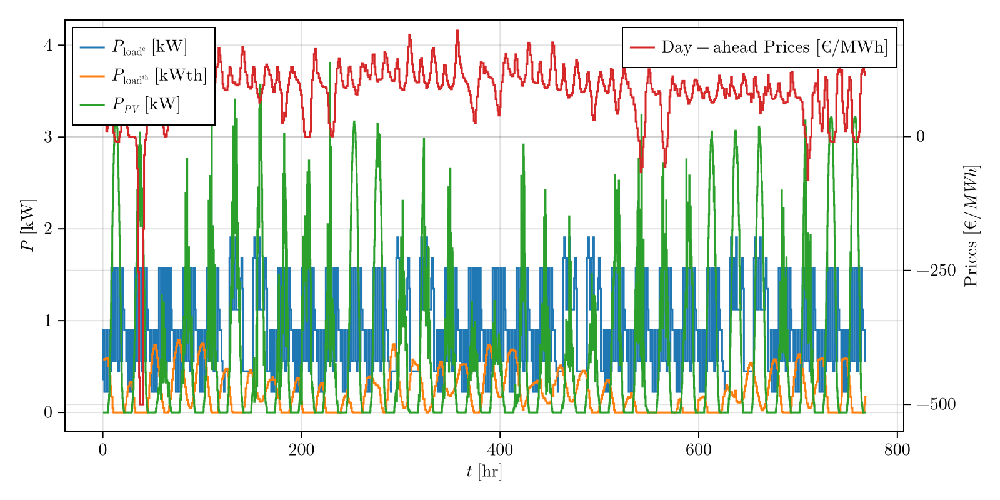

In [5]:
makeInputsplot(inputs[:summer][:"grid"], inputs[:summer][:"SPV"])

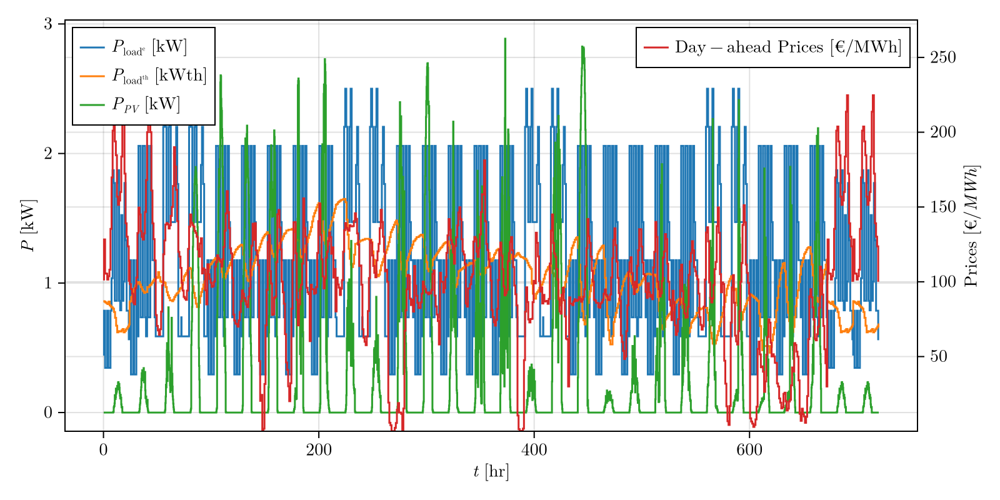

In [6]:
makeInputsplot(inputs[:winter][:"grid"], inputs[:winter][:"SPV"])

## <a id='toc1_3_'></a>[Reduced Order Models](#toc0_)

In this section we present the reduced order models for the cells of the system, both new and used as well as for LFP and NMC chemistries. The Physics-Based Reduced Order Models (PBROM) from `LiiBRA.jl` have the structure:

$$
\begin{align}
    x'_{t+1} = A.x_t + B. u_t \\
    x_{t} = y'_t = C.x'_t + D. u_t \\
    y_t = h(x_t, x'_t, u_t) \\
\end{align}
$$

where $x'_t$ are the pseudo-states which don't have any physical meaning, $x_t$ are the true physical states of the system, $u_t$ are the inputs and $y_t$ are the outputs. The vectors are:

$$
\begin{align}
    x_t = \begin{bmatrix} C_{e,k} \\
    \phi_{e,k} \\
    \tilde{C}_{s,e,k} \\
    \phi_{s,k} \\
    J
    \end{bmatrix}, \ 
    y_t = \begin{bmatrix} \tilde{C}_{se,k} \\
    \theta_{k} \\
    SOC \\
    j_{k} \\
    R_{k} \\
    U_{\textrm{OCP},k}\\
    \phi_{se,k} \\
    \phi_{s,k} \\
    \phi_{\tilde{e},1} \\
    \phi_{\tilde{e},2} \\
    \eta_{k} \\
    v_t
    \end{bmatrix}, \
\end{align}

In [7]:
# import LiiBRA.Params
function age_cell!(Cell, α::Float64)
    # nEV = length(data[:"EV"]);
    β = (1-α)/2; # SoHR0 [p.u.]
    # Capacity fade
    # data[:"BESS"].GenInfo.SoHQ = α;
    # data[:"BESS"].GenInfo.initQ *= α
    Cell.Neg.θ_100 *= α
    # Power fade
    # data[:"BESS"].GenInfo.SoHR0 *= (1+β);
    # @unpack_JinAgingParams data[:"BESS"].AgingParameters;
    # 1=εₑ+εₛ
    # data[:"BESS"].AgingParameters.εₑ0 += data[:"BESS"].AgingParameters.as * (κref .* εₑ0^brug)  / εₛ * β * data[:"BESS"].PerfParameters.R0Param;
    εₑ0 = 1 - Cell.Neg.ϵ_s;    
    εₑ0 -= Cell.Neg.as * (Cell.Const.κ .* εₑ0^Cell.Neg.κ_brug)  / Cell.Neg.ϵ_s * β * Cell.Neg.RFilm / Cell.Const.CC_A / 1e4;
    Cell.Neg.ϵ_s -= Cell.Neg.as * (Cell.Const.κ .* εₑ0^Cell.Neg.κ_brug)  / Cell.Neg.ϵ_s * β * Cell.Neg.RFilm / Cell.Const.CC_A / 1e4;
    # data[:"BESS"].AgingParameters.δSEI0 += (κref .* εₑ0^brug)  / εₛ * β * data[:"BESS"].PerfParameters.R0Param;
    # data[:"BESS"].PerfParameters.R0Param *= (1+β);
    Cell.Neg.RFilm *= (1+β);
    return Cell
end

age_cell! (generic function with 1 method)

In [8]:
#---------- Cell Definition -----------------#
Cell = Construct("LG M50")
SList = [1.0, 0.1]
SoHList = [1.0 0.9]; SOC0 = 1.;
Sₑ = 4 # Spatial points in electrolyte

Sₛ = 2 # Spatial point in solid
Spatial!(Cell, Sₑ, Sₛ)
#---------- Aging -----------------#
# adapt the Cell to the BESSData
bess = inputs[:summer]["BESS"];
Cell.Neg.RFilm = Cell.Neg.RFilm + bess.GenInfo.SoHR0;

# newA, newB, newC, newD = Realise(newCell, SList);
# ageA, ageB, ageC, ageD = Realise(agedCell, SList);

0.028111218835866623

In [9]:
Results = tₑₜ = pbrom = tuple()
for SoH ∈ SoHList
    age_cell!(Cell, SoH)
    A, B, C, D = Realise(Cell, SList)
    Result, tₑ = CC(Cell, SList, SOC0, 2.0, 9600, A, B, C, D)
    pbrom = flatten_(pbrom, (A = A, B = B, C = C, D = D))
    Results = flatten_(Results, Result)
    tₑₜ = flatten_(tₑₜ, tₑ)
end

In [10]:
Cell.RA.Fs = 1.0 # Modify transfer function sampling frequency
Cell.RA.SamplingT = 1.0 # Modify final system sampling period
Cell.Const.T = 298.15 # Modify cell temperature
Cell.RA.H1 = Cell.RA.H2 = [1:2500; 3000:3500; 4000:4500]
Cell.RA.M = 5
Ŝ = collect(1.0:-1.0:0) # List of SOC points for model generation
SOC0 = 1.0 # Starting SOC
α = collect(0.95:-0.1:0.75)

function DegLp(α)
    Results = tₑₜ = pbrom = tuple()
    for ψ in α
        Cell.Neg.θ_100 = ψ
        A, B, C, D = Realise(Cell, Ŝ)
        Result, tₑ = CC(Cell, Ŝ, SOC0, 2.0, 9600, A, B, C, D)
        pbrom = flatten_(pbrom, (A = A, B = B, C = C, D = D))
        Results = flatten_(Results, Result)
        tₑₜ = flatten_(tₑₜ, tₑ)
    end
    return Results, tₑₜ, pbrom
end

Results, tₑₜ, pbrom = DegLp(α)

Unstable System: A has indices of negative values
Unstable System: A has indices of negative values
Unstable System: A has indices of negative values


(((θₙ = [0.95; 0.95; … ; 0.0; 0.0;;], θₚ = [0.263849; 0.263849; … ; 0.0; 0.0;;], jeqₙ = [1.5336324601753441e-6; 1.5336324601753441e-6; … ; 0.0; 0.0;;], jeqₚ = [3.117330516865954e-5; 3.117330516865954e-5; … ; 0.0; 0.0;;], x = [0.0 0.0 … 0.0 0.0; 0.0 0.0 … 0.0 0.0; … ; 0.0 0.0 … 0.0 0.0; 0.0 0.0 … 0.0 0.0], y = [0.0 0.0 … 0.0 0.0; 0.0 0.0 … 0.1186366756610532 0.12555916236276268; … ; 0.0 0.0 … 0.0 0.0; 0.0 0.0 … 0.0 0.0], Cseₙ = [31476.35 31476.35; 31476.35 31476.35; … ; 0.0 0.0; 0.0 0.0], Cseₚ = [16649.927296 16649.927296; 16649.927296 16649.927296; … ; 0.0 0.0; 0.0 0.0], Ce = [1000.0 1000.0 1000.0 1000.0; 1000.0 1000.0 1000.0 1000.0; … ; 1000.0 1000.0 1000.0 1000.0; 1000.0 1000.0 1000.0 1000.0], η₀ = [0.0; 0.07356489013609072; … ; 0.0; 0.0;;], ηₙ = [0.0 0.0; 0.07356489013609072 0.07617896280690792; … ; 0.0 0.0; 0.0 0.0], ηL = [0.0; -0.008866892863467249; … ; 0.0; 0.0;;], ηₚ = [0.0 0.0; -0.008866892863467249 -0.006201710880875276; … ; 0.0 0.0; 0.0 0.0], ϕ_ẽ1 = [0.0 0.0 0.0; -0.006929071

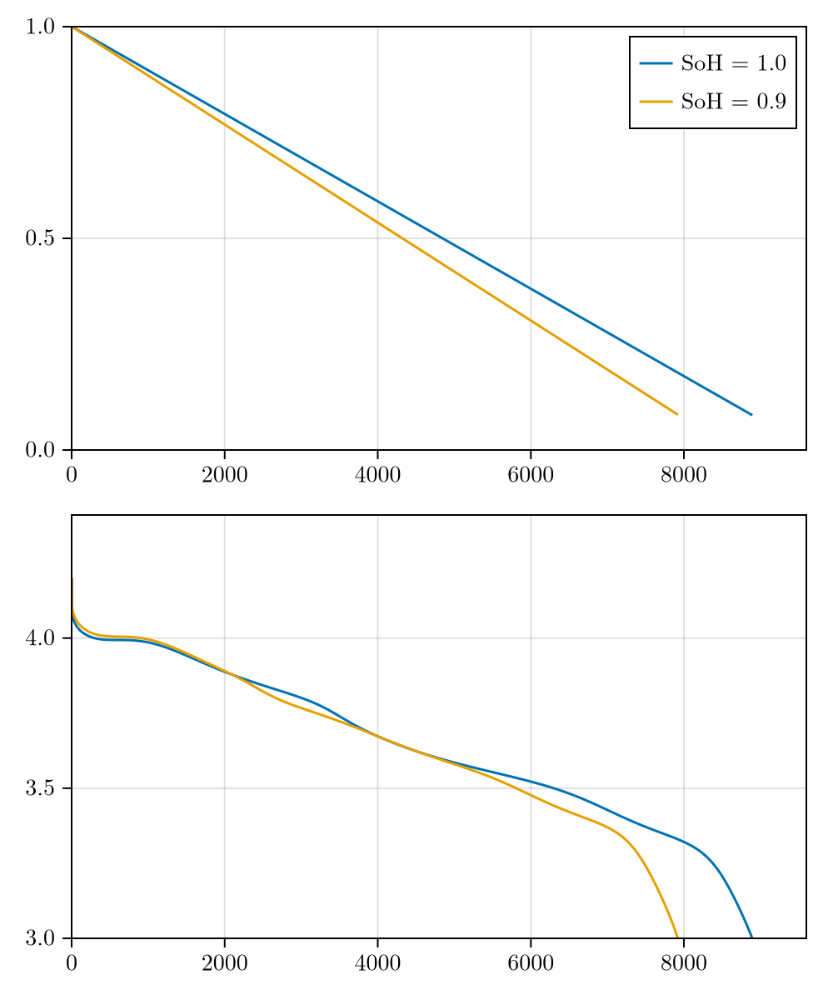

In [16]:
CairoMakie.activate!()
set_theme!(theme_latexfonts())
f = Figure(size = (500, 600))
ax1 = Axis(f[1, 1])
ax2 = Axis(f[2, 1])
for i in 1:length(SoHList)
    lines!(ax1, 1:length(Results[i].Cell_SOC[:]), Results[i].Cell_SOC[:], label = "SoH = $(SoHList[i])")
    lines!(ax2, 1:length(Results[i].Cell_SOC[:]), Results[i].Cell_V[:])
end
# set y axis limits
limits!(ax2, 0, 9600, 3., nothing)
limits!(ax1, 0, 9600, 0., 1.0)
axislegend(ax1)
# DataInspector(f)
f

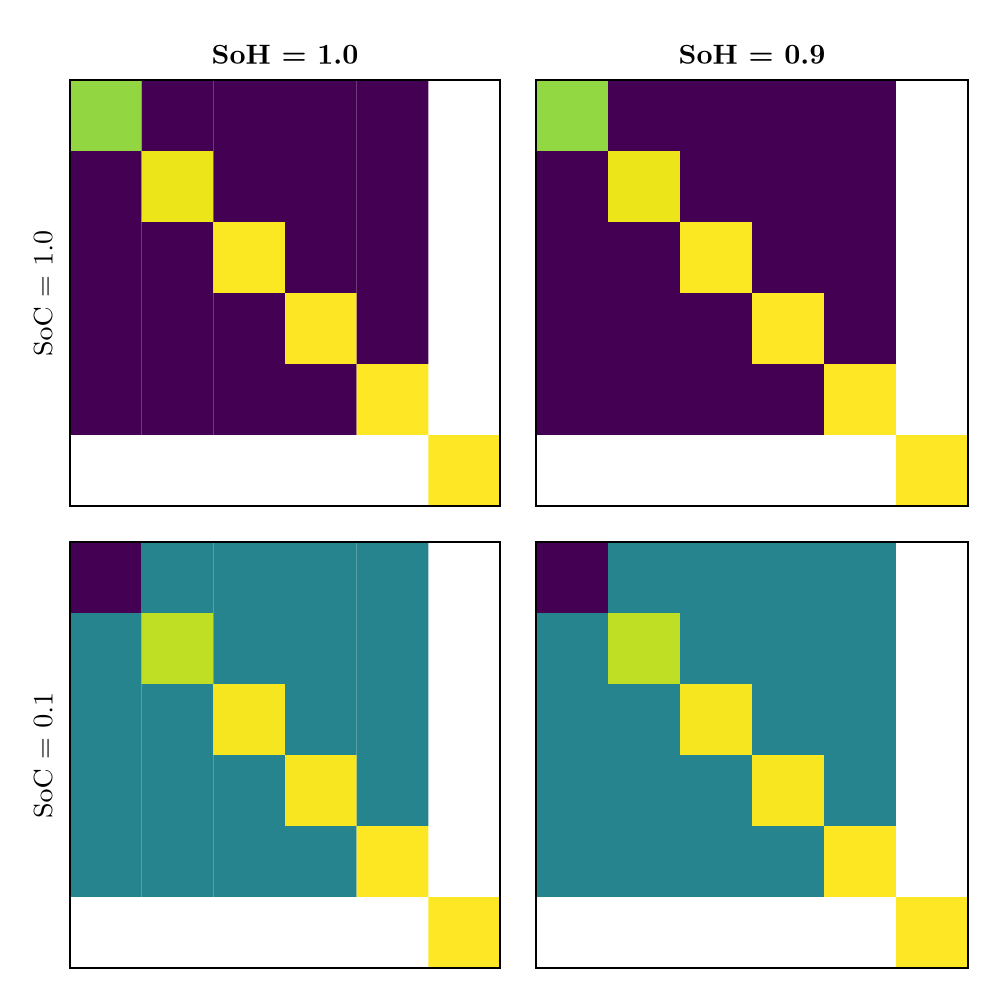

In [12]:
CairoMakie.activate!()
f = Figure(size = (500, 500))
ax = [Axis(f[i, j]) for i ∈ 1:length(SList), j ∈ 1:length(SoHList)]
[ax[i,j].yreversed=true for i ∈ 1:length(SList), j ∈ 1:length(SoHList)]
[ax[1,j].title="SoH = $(SoHList[j])" for j ∈ 1:length(SoHList)]
[ax[i,1].ylabel="SoC = $(SList[i])" for i ∈ 1:length(SList)]
for j in 1:length(SoHList)
    for i in 1:length(SList)
        spy!(ax[i,j], pbrom[j].A[i], colormap = :viridis)
    end
end
hidexdecorations!.(ax); hideydecorations!.(ax, label = false)
f

In [13]:
pbrom[1].A[1]

6×6 Matrix{Float64}:
  0.837333      1.00161e-15  -3.63326e-16   5.01346e-17   3.1844e-17   0.0
  7.31825e-17   0.971394     -2.87711e-17   1.37631e-16   9.33264e-17  0.0
  9.91197e-17  -1.17853e-16   0.995527     -2.76974e-17   1.37096e-16  0.0
 -5.73561e-17   1.20414e-16  -1.95261e-16   0.999346     -5.36484e-17  0.0
 -7.33616e-17   1.38024e-17   7.61381e-17  -2.72957e-17   0.999999     0.0
  0.0           0.0           0.0           0.0           0.0          1.0

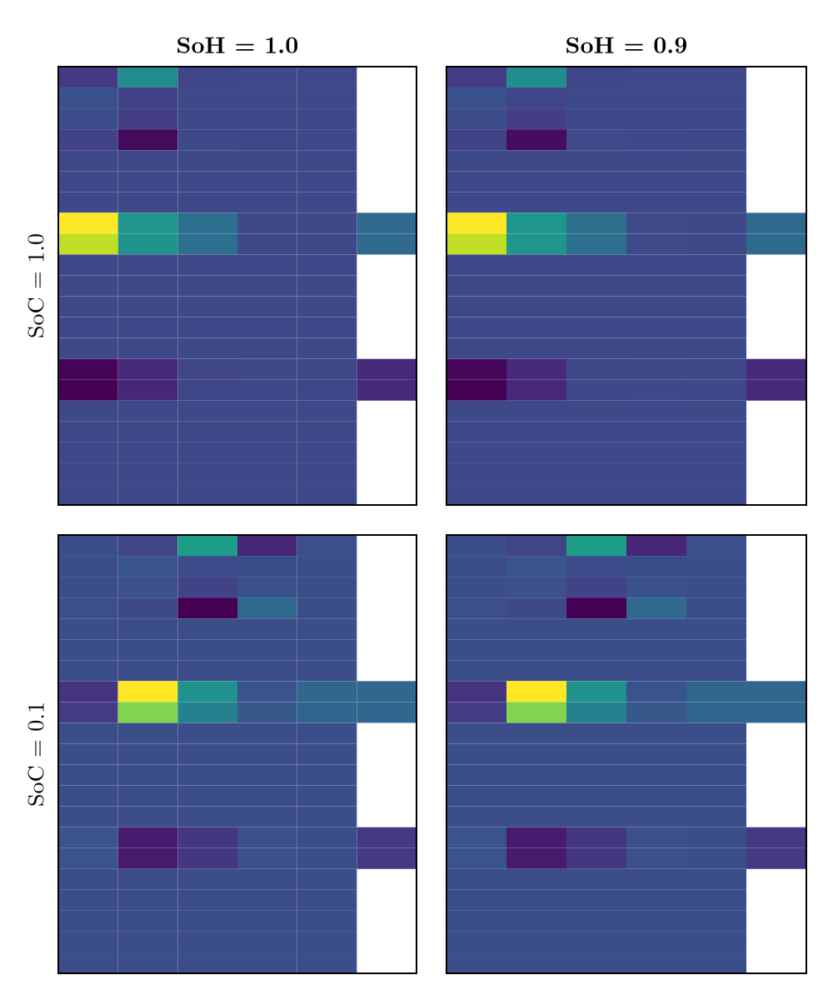

In [14]:
CairoMakie.activate!()
f = Figure(size = (500, 600))
ax = [Axis(f[i, j]) for i ∈ 1:length(SList), j ∈ 1:length(SoHList)]
[ax[i,j].yreversed=true for i ∈ 1:length(SList), j ∈ 1:length(SoHList)]
[ax[1,j].title="SoH = $(SoHList[j])" for j ∈ 1:length(SoHList)]
[ax[i,1].ylabel="SoC = $(SList[i])" for i ∈ 1:length(SList)]
for j in 1:length(SoHList)
    for i in 1:length(SList)
        spy!(ax[i,j], pbrom[j].C[i]', colormap = :viridis)
    end
end
hidexdecorations!.(ax); hideydecorations!.(ax, label = false)
f

In [2]:
[det(pbrom[j].A[i]) for j in 1:length(SoHList), i in 1:length(SList)]

UndefVarError: UndefVarError: `SoHList` not defined in `Main`
Suggestion: check for spelling errors or missing imports.

In [16]:
[det(pbrom[j].C[i]) for j in 1:length(SoHList), i in 1:length(SList)]

DimensionMismatch: DimensionMismatch: matrix is not square: dimensions are (21, 6)

# <a id='toc2_'></a>[Dispatch analysis](#toc0_)
- **CPBDeg** Equivalent Circuit Model with Physics-based degradation
- **BNoDeg** Bucket model without degradation

The *BNoDeg* planner doesn't see the degradation of the battery, so it will always try to use the battery as if were new. The *CPBDeg* planner, on the other hand, will try to use the battery in a way that minimizes the degradation or at least balancing it with the grid cost. The following sections will show the dispatch of the system for both planners.

Plotting function definitions

In [30]:
# function defs
function create_Pfig(results, P_key, label;
    backend::String="GLMakie",
    filename::String="fig.png",
    step::Int = 50,
    )
    @assert backend ∈ ["CairoMakie", "GLMakie"] "backend must be either CairoMakie or GLMakie"
    if backend == "CairoMakie"
        CairoMakie.activate!(type = "svg")
    else
        GLMakie.activate!()
    end
    
    set_theme!(theme_latexfonts())
    f=Figure(size=(800, 600))
    # colors=ColorSchemes.tab10.colors;
    colors=ColorSchemes.Set1_9.colors;
    styles = [:solid, :dash]
    ax1=Axis(f[1,1];
            title = L"\textrm{Summer}",
            xlabel=L"$t$ [hr]", ylabel=label,
            )
    ax2=Axis(f[2,1];
            title = L"\textrm{Winter}",
            xlabel=L"$t$ [hr]", ylabel=label,
            )
    axes = [ax1, ax2]
    
    for (d, DAtype) ∈ enumerate([:CPBDeg, :BNoDeg]) # loop over the DAtype
        for (j, season) ∈ enumerate([:summer, :winter]) # loop over the season
            for (i, SoH) ∈ enumerate([1, 0.9]) # loop over the SoH
                concRes = results[DAtype][season][:results][i]
                t = convert.(Float64, concRes["t"])
                Psa = convert.(Float64, concRes[P_key])
                stairs!(axes[j], t./3600, Psa, color=colors[i], label="$(String(DAtype)) SoH = $(Int(SoH*100))%",
                        linewidth=2, step=:post, linestyle=styles[d],
                        )
                limits!(axes[j], t[1]/3600, t[end]/3600, nothing, nothing);
            end
        end
    end
    axislegend(ax1, position=:rb, merge = true)
    hidexdecorations!(ax1, grid = false)
    # axislegend(ax2, position=:rb)
    if backend == "CairoMakie"
        save(filename, f)
        return f
    else
        return display(GLMakie.Screen(), f)
    end
end

function create_SPfig(results, key;
                    backend::String="GLMakie",
                    filename::String="fig.png",
                    cmaps::Symbol=:balance,
                    lims=([-7.5, 7.5], [0.2, 0.8]), # xmin xmax ymin ymax
                    nb::Int=80,
                    )
    @assert backend ∈ ["CairoMakie", "GLMakie"] "backend must be either CairoMakie or GLMakie"
    if backend == "CairoMakie"
        CairoMakie.activate!(type = "svg")
    else
        GLMakie.activate!()
    end

    set_theme!(theme_latexfonts())
    f=Figure(size=(1000, 400))
    axes=[];

    # setup keys
    SoC_key = "SoC$key";
    key == "ev[1]" ? key = "evTot[1]" : nothing;
    P_key = "P$key";
    
    for (j, season) ∈ enumerate([:summer, :winter]) # loop over the season
        for (d, DAtype) ∈ enumerate([:BNoDeg, :CPBDeg]) # loop over the DAtype
            for (i, SoH) ∈ enumerate([1, 0.9]) # loop over the SoH
                concRes = results[DAtype][season][:results][i]
                Psa = convert.(Float64, concRes[P_key])
                SoCsa = convert.(Float64, concRes[SoC_key])
                if key == "evTot[1]"
                    # exclude the points where the EV is not connected
                    γ_cont = concRes[:"γf"][:]
                    Psa = Psa[γ_cont .== 1];
                    SoCsa = SoCsa[γ_cont .== 1];
                end
                ax = Axis(f[i,j*2+d-2];
                    # title = "$season SoH = $(Int(SoH*100))%",
                    xlabel=L"$P$ [kW]", ylabel=L"$SoC$ [p.u.]",
                    )
                # Create a 2D histogram
                histogram, xedges, yedges = hist2d(Psa, SoCsa; nbins=nb, normalize=true)
                co = contourf!(ax, xedges[2:end], yedges[2:end], histogram,
                            levels=0.01:0.1:1, colormap=cmaps, mode = :relative,
                            label = "$DAtype"
                            )
                # limits!(ax, -7.5, 7.5, 0.2, 0.8);
                limits!(ax, lims[1][1], lims[1][2], lims[2][1], lims[2][2]);
                axislegend(ax, position=:lb, merge = true, unique=false)
                i == 1 ? hidexdecorations!(ax, grid = false) : nothing;
                i ≥ 2 ? Colorbar(f[i+1,j*2+d-2], co, vertical = false) : nothing;
                (j*2+d-2) == 1 ? nothing : hideydecorations!(ax, grid = false);
                push!(axes, ax)
            end
        end
    end
    Label(f[1, 1:end, Top()], "SoH = 100%", valign = :bottom,
        font = :bold,
        padding = (0, 0, 5, 0))
    Label(f[2, 1:end, Top()], "SoH = 90%", valign = :bottom,
        font = :bold,
        padding = (0, 0, 5, 0))
    Label(f[1:end, 1:2, Top()], "Summer", valign = :bottom,
        padding = (0, 0, 5, 0))
    Label(f[1:end, 3:4, Top()], "Winter", valign = :bottom,
        padding = (0, 0, 5, 0))
    if backend == "CairoMakie"
        save(filename, f)
        return f
    else
        return display(GLMakie.Screen(), f)
    end
end

function create_FECQlossfig(results;
    step::Int=150,
    backend::String="GLMakie",
    filename::String="fig.png")
    @assert backend ∈ ["CairoMakie", "GLMakie"] "backend must be either CairoMakie or GLMakie"
    if backend == "CairoMakie"
        CairoMakie.activate!(type = "svg")
    else
        GLMakie.activate!()
    end
    set_theme!(theme_latexfonts())
    f=Figure(size=(800, 300))
    colors=ColorSchemes.Set1_9.colors;
    # ax11=Axis(f[1,1];
    #         title = L"\textrm{Summer}",
    #         ylabel=L"$Q_{\textrm{loss}}$ [%]",
    #         )
    # ax12 = Axis(f[1,2];
    #         title = L"\textrm{Winter}",
    #         )
    # ax21=Axis(f[2,1]; ylabel = L"FEC",
    #         xlabel = L"$t$ [hr]",
    #         );
    # ax22=Axis(f[2,2];
    #         xlabel = L"$t$ [hr]", 
    #         )
    ax31=Axis(f[1,1]; ylabel = L"$Q_{\textrm{loss}}$ [%]",
            xlabel = L"$FEC$",
            );
    ax32=Axis(f[1,2];
            xlabel = L"$FEC$", 
            )
    # ax=[ax11 ax12;
    #    ax21 ax22;
    #    ax31 ax32]
    ax=[ax31 ax32]
    markers = [:circle, :diamond]
    styles = [:dash, :solid]
    for (da,DAtype) ∈ enumerate([:BNoDeg, :CPBDeg])
            for (i,season) ∈ enumerate([:summer, :winter])
            # loop over the SoH
                for (j, SoH) ∈ enumerate([1, 0.9])
                    concRes = results[DAtype][season][:results][j]
                    t = convert.(Float64, concRes["t"]); Δt = t[2] - t[1]
                    for (d, sa) ∈ enumerate(["bess","ev[1]"])
                            Qsa = convert.(Float64, concRes["Q$sa"])
                            Qsa0 = Qsa[1]
                            isa = convert.(Float64, concRes["i$sa"])
                            FECsa = cumsum(abs.(isa)) .* Δt / 3600 / (2 * Qsa0)
                            sa == "bess" ? salbl = "BESS" : salbl = "EV"
                            # # Qloss vs time
                            # stairs!(ax[1,i], t./3600, 100 * (Qsa .- Qsa0)./Qsa0,
                            #         color=colors[j], linewidth=2, 
                            #         step=:post, linestyle=styles[da],
                            #         )
                            # scatter!(ax[1,i], t[1:step:end]./3600, 100 * (Qsa[1:step:end] .- Qsa0)./Qsa0,
                            #         color=(colors[j], 0.5), marker = markers[d], markersize=15,
                            #         strokecolor = colors[j], 
                            #         )
                            # # fec vs time
                            # stairs!(ax[2,i], t./3600, FECsa,
                            #         color=colors[j], linewidth=2, 
                            #         step=:post, linestyle=styles[da],
                            #         )
                            # scatter!(ax[2,i], t[1:step:end]./3600, FECsa[1:step:end],
                            #         color=(colors[j], 0.5),marker = markers[d], markersize=15,
                            #         strokecolor = colors[j], 
                            #         )
                            # Qsa vs FEC
                            stairs!(ax[1,i], FECsa, (Qsa .- Qsa0)/Qsa0,
                                    color=colors[j], label="$(String(DAtype)) SoH=$(Int(SoH*100))%",
                                    linewidth=2, step=:post, linestyle=styles[da],
                                    )
                            scatter!(ax[1,i], FECsa[1:step:end], (Qsa[1:step:end] .- Qsa0)./Qsa0,
                                    color=(colors[j], 0.5), label="$salbl",
                                    marker = markers[d], markersize=15,
                                    strokecolor = colors[j], 
                                    )
                    end
                    limits!.(ax, t[1]/3600, t[end]/3600, nothing, nothing);
                    limits!.(ax[1,:], nothing, nothing, nothing, nothing)
                end   
            end
            # axislegend(ax[i], position=:lb, merge = true)
    end
    hideydecorations!.(ax[1,2], grid = false)
    # hidexdecorations!.(ax[1,:], grid = false)
    linkyaxes!(ax[1,1], ax[1,2]); 
    # linkyaxes!(ax[2,1], ax[2,2])
    # axislegend(ax[1,2], position=:rt, merge = true, unique=false)
    # Legend(f[3,3], ax[3,2], position=:rt, merge = true, unique=false)
    # limits!.(ax[3,:], 0, 7, nothing, nothing)
    # add text for the seasons
    text!(ax31, 16, -0.5e-5, text = "Summer", fontsize = 15)
    text!(ax32, 21, -0.5e-5, text = "Winter", fontsize = 15)
    # create legend
    group_type = [LineElement(linestyle = styles[i]) for i ∈ 1:2]
    group_soh = [PolyElement(color = colors[j], strokecolor = :transparent) for j ∈ 1:2]
    group_sa = [MarkerElement(marker = mkr, color = (:gray, 0.5), strokecolor = :gray, markersize = 15) for mkr ∈ markers]

    legends = Legend(f[1,1],
        hcat([group_soh, group_type, group_sa]...)[:],
        ["SoH = 100%", "SoH = 90%", "BNoDeg", "CPBDeg", "BESS", "EV"],
        tellheight = false, tellwidth = false,
        halign = :left, valign = :bottom,
        nbanks = 2,
        orientation = :horizontal,
        margin = (5,5,5,5),
        )

    if backend == "CairoMakie"
            save(filename, f)
            return f
    else
            return display(GLMakie.Screen(), f)
    end
end

create_FECQlossfig (generic function with 1 method)

In [17]:
# Build the data dictionary
W=[1 1000 1e4 1000] 
s=modelSettings(nEV=1, t0=1/4,Tw=48-1/4, Δt=1/4, steps=29, costWeights=W,
                season="winter", profType="monthly", loadType="GV", year=2023, cellID="SYNSANYO");
EMSData=build_data(;nEV = s.nEV, season = s.season, profType = s.profType, loadType = s.loadType,
                 year = s.year, cellID=s.cellID);
folder = "../data/output/Run24/";
results = Dict(:CPBDeg => Dict(), :BNoDeg => Dict())
results[:CPBDeg] = Dict(:summer => JSON3.read(open(folder * "cs3_R24_MPC_CPBDeg_NMC_summer.json", "r"), Dict{Symbol, Any}),
                        :winter => JSON3.read(open(folder * "cs3_R24_MPC_CPBDeg_NMC_winter.json", "r"), Dict{Symbol, Any}));
results[:BNoDeg] = Dict(:summer => JSON3.read(open(folder * "cs3_R24_MPC_BNoDeg_NMC_summer.json", "r"), Dict{Symbol, Any}),
                        :winter => JSON3.read(open(folder * "cs3_R24_MPC_BNoDeg_NMC_winter.json", "r"), Dict{Symbol, Any}));

The structure of the results is as follows:
- BNoDeg
  - summer
    - $\alpha$
    - results
      - New battery
      - Used battery
    - controller
      - New battery
      - Used battery
  - winter
    - ...
- CPBDeg
  - ...

### <a id='toc2_1_1_'></a>[Battery](#toc0_)

Battery dispatch

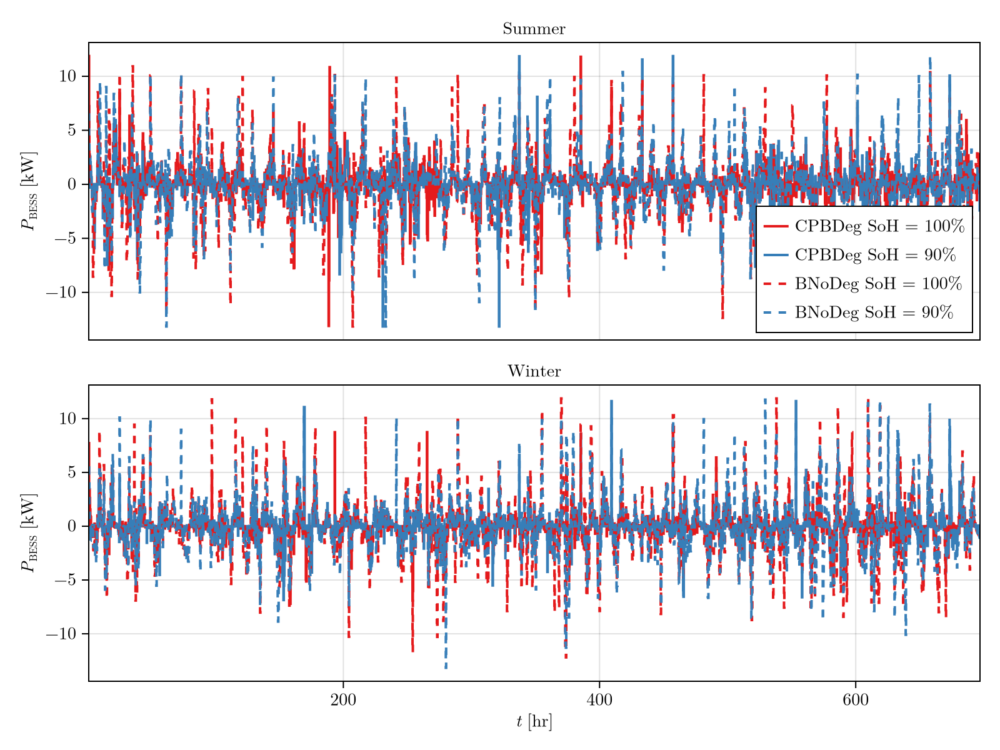

In [18]:
folder = "../images/AppEnergy/cs3/"; # relative path to the
label=L"$P_{\textrm{BESS}}$ [kW]"
P_key = "Pbess";filename="CS3_Pbess_SOH.pdf"
create_Pfig(results, P_key, label; backend="CairoMakie", filename=folder*filename)

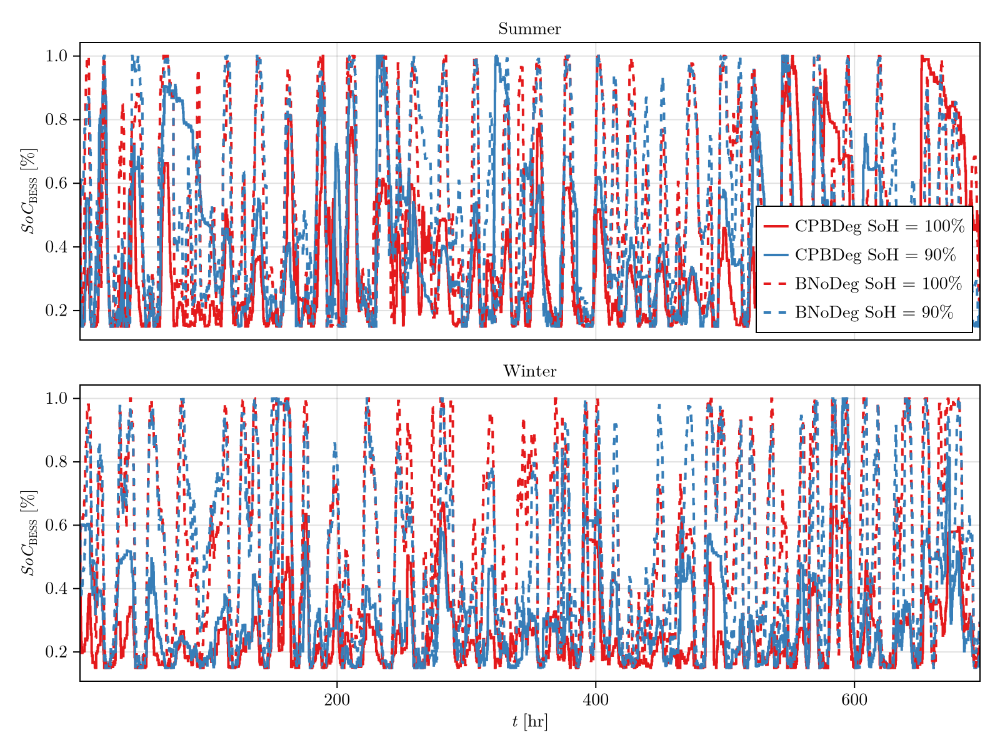

In [19]:
label=L"$SoC_{\textrm{BESS}}$ [%]"
P_key = "SoCbess";filename="CS3_SoCbess_SOH.pdf"
create_Pfig(results, P_key, label; backend="CairoMakie", filename=folder*filename)

In [20]:
dfRMS = DataFrame(DAtype = Symbol[], season = Symbol[], SoH = Float64[], RMS = Float64[])
for DAtype ∈ [:CPBDeg, :BNoDeg]
    for season ∈ [:summer, :winter]
        for α ∈ [1 2]
            SoCbess⁺ = results[DAtype][season][:results][α]["SoCbess"]
            SoCbess⁻ = results[DAtype][season][:controller][α][:"SoCbess"]
            εbess = SoCbess⁺ - SoCbess⁻
            #calculate the bias RMS
            RMS = sqrt(mean(εbess.^2))
            println("RMS for $DAtype $season SoH = $(100+(1-α)*10)%: $RMS")
            # save the bias RMS in a dataframe
            df = [DAtype, season, 100+(1-α)*10, RMS]
            # add row to the dataframe
            push!(dfRMS, df)
        end
    end
end
dfRMS

RMS for CPBDeg summer SoH = 100%: 0.0
RMS for CPBDeg summer SoH = 90%: 0.0
RMS for CPBDeg winter SoH = 100%: 0.0
RMS for CPBDeg winter SoH = 90%: 0.0
RMS for BNoDeg summer SoH = 100%: 0.0
RMS for BNoDeg summer SoH = 90%: 0.0
RMS for BNoDeg winter SoH = 100%: 0.0
RMS for BNoDeg winter SoH = 90%: 0.0


Row,DAtype,season,SoH,RMS
,Symbol,Symbol,Float64,Float64
1,CPBDeg,summer,100.0,0.0
2,CPBDeg,summer,90.0,0.0
3,CPBDeg,winter,100.0,0.0
4,CPBDeg,winter,90.0,0.0
5,BNoDeg,summer,100.0,0.0
6,BNoDeg,summer,90.0,0.0
7,BNoDeg,winter,100.0,0.0
8,BNoDeg,winter,90.0,0.0


Model biases always worse in BNoDeg than in CPBDeg. It gets even worse in summer because there's more opportunities for arbitrage (due to solar gen and consecuent price volatility). CPBDeg maintains model bias for both new and used batteries, whereas BNoDeg has a higher bias for the used battery.

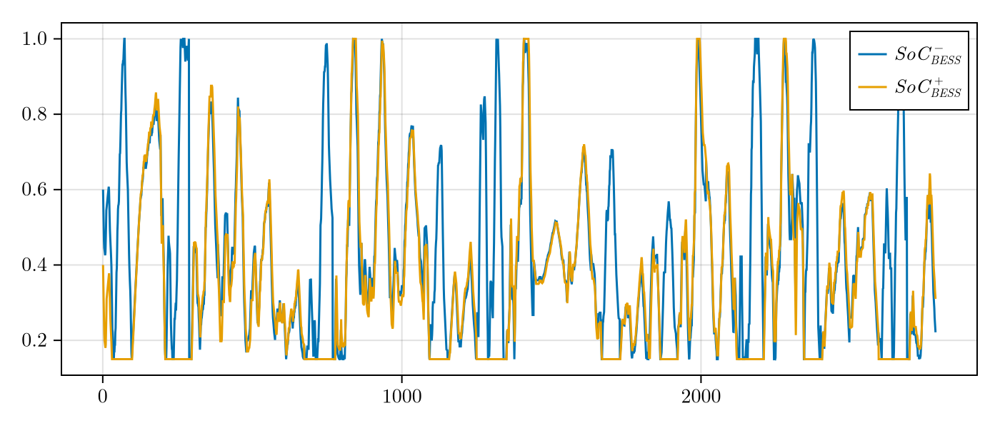

In [ ]:
CairoMakie.activate!()
set_theme!(theme_latexfonts())
f = Figure(size = (700, 300))
ax = Axis(f[1, 1])
# CPBDeg model bias for SoH=100%
SoCbess⁺ = results[:CPBDeg][:summer][:results][1]["SoCbess"]
SoCbess⁻ = results[:CPBDeg][:summer][:controller][1][:"SoCbess"]
εbess = SoCbess⁺ - SoCbess⁻
#calculate the bias RMS
RMS = sqrt(mean(εbess.^2))
lines!(ax, 1:length(SoCbess⁺), SoCbess⁻, label = L"SoC_{BESS}^{-}")
lines!(ax, 1:length(SoCbess⁺), SoCbess⁺, label = L"SoC_{BESS}^{+}")
# # CPBDeg model bias for SoH=90%
# SoCbess⁺ = results[:CPBDeg][:summer][:results][2]["SoCbess"]
# SoCbess⁻ = results[:CPBDeg][:summer][:controller][2][:"SoCbess"]
# lines!(ax, 1:length(SoCbess⁻), SoCbess⁺, label = L"SoC_{BESS}^{+}")
# lines!(ax, 1:length(SoCbess⁻), SoCbess⁻, label = L"SoC_{BESS}^{-}")
axislegend(ax)
f
̃B

### <a id='toc2_1_2_'></a>[EV dispatch](#toc0_)

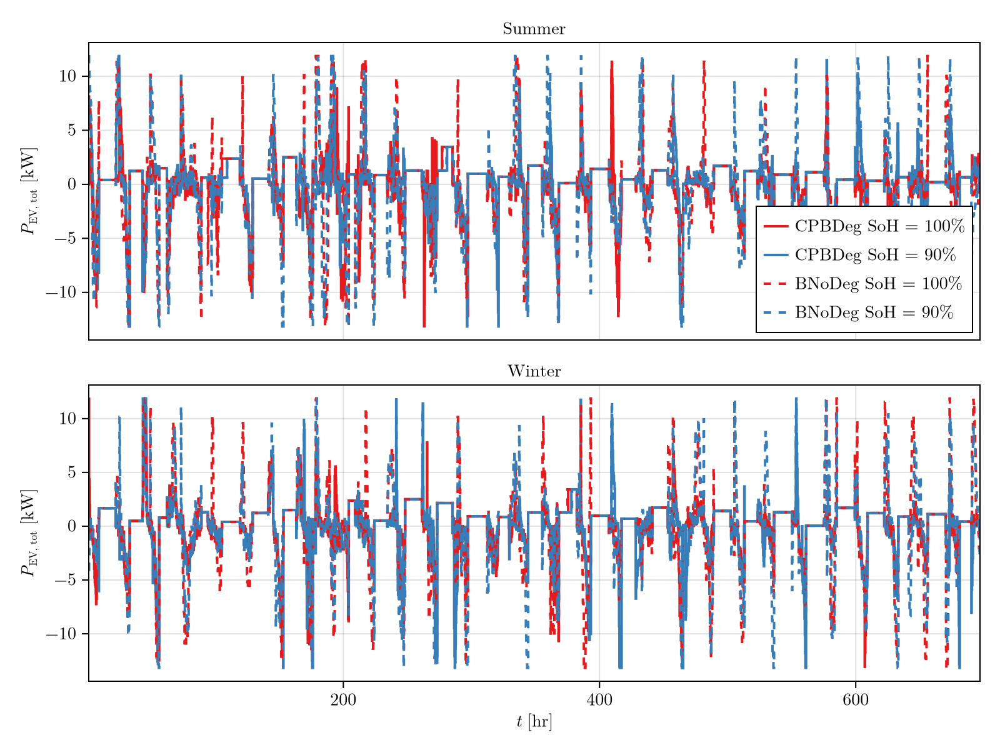

In [31]:
label = L"$P_{\textrm{EV, tot}}$ [kW]"
P_key = "PevTot[1]"; filename="CS3_Pev_SOH.pdf"
create_Pfig(results, P_key, label; backend="CairoMakie", filename=folder*filename)

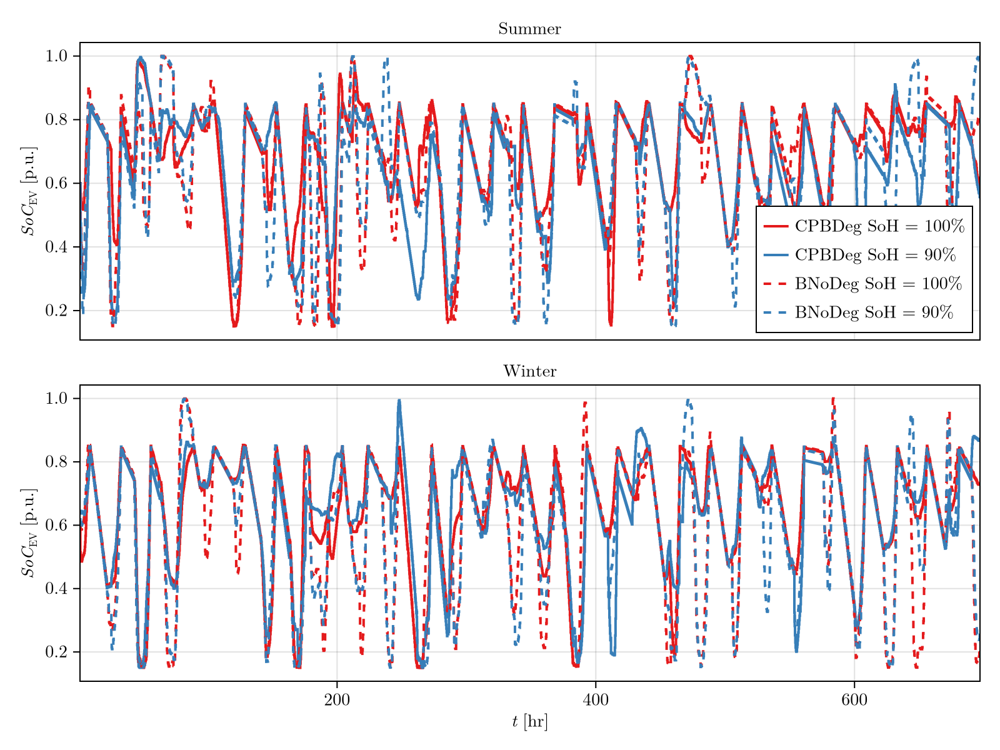

In [22]:
label = L"$SoC_{\textrm{EV}}$ [p.u.]"
P_key = "SoCev[1]"; filename="CS3_SoCev_SOH.pdf"
create_Pfig(results, P_key, label; backend="CairoMakie", filename=folder*filename)

In [23]:
dfRMS = DataFrame(DAtype = Symbol[], season = Symbol[], SoH = Float64[], RMS = Float64[])
for DAtype ∈ [:CPBDeg, :BNoDeg]
    for season ∈ [:summer, :winter]
        for α ∈ [1 2]
            SoCbess⁺ = results[DAtype][season][:results][α]["SoCev[1]"]
            SoCbess⁻ = results[DAtype][season][:controller][α][:"SoCev[1]"]
            εbess = SoCbess⁺ - SoCbess⁻
            #calculate the bias RMS
            RMS = sqrt(mean(εbess.^2))
            println("RMS for $DAtype $season SoH = $(100+(1-α)*10)%: $RMS")
            # save the bias RMS in a dataframe
            df = [DAtype, season, 100+(1-α)*10, RMS]
            # add row to the dataframe
            push!(dfRMS, df)
        end
    end
end
dfRMS

RMS for CPBDeg summer SoH = 100%: 0.0
RMS for CPBDeg summer SoH = 90%: 0.0
RMS for CPBDeg winter SoH = 100%: 0.0
RMS for CPBDeg winter SoH = 90%: 0.0
RMS for BNoDeg summer SoH = 100%: 0.0
RMS for BNoDeg summer SoH = 90%: 0.0
RMS for BNoDeg winter SoH = 100%: 0.0
RMS for BNoDeg winter SoH = 90%: 0.0


Row,DAtype,season,SoH,RMS
,Symbol,Symbol,Float64,Float64
1,CPBDeg,summer,100.0,0.0
2,CPBDeg,summer,90.0,0.0
3,CPBDeg,winter,100.0,0.0
4,CPBDeg,winter,90.0,0.0
5,BNoDeg,summer,100.0,0.0
6,BNoDeg,summer,90.0,0.0
7,BNoDeg,winter,100.0,0.0
8,BNoDeg,winter,90.0,0.0


### <a id='toc2_1_3_'></a>[TESS dispatch](#toc0_)

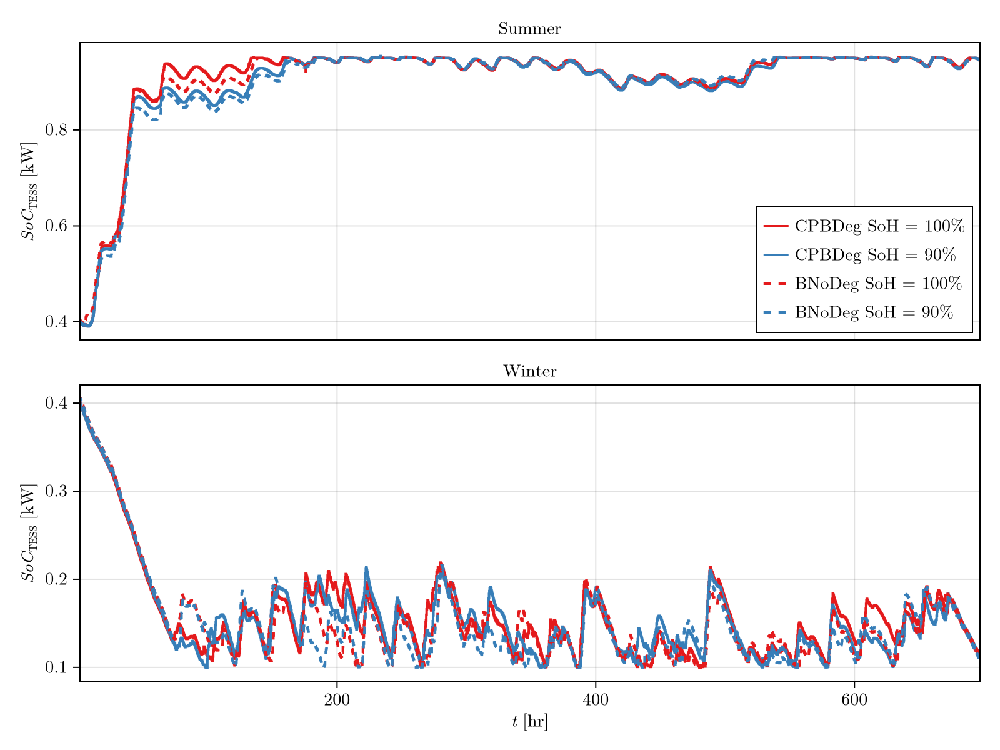

In [24]:
label = L"$SoC_{\textrm{TESS}}$ [kW]"
P_key = "SoCtess"; filename="CS3_SoCtess_SOH.pdf"
create_Pfig(results, P_key, label; backend="CairoMakie", filename=folder*filename)

During the winter the *CPBDeg* charges less energy into the battery than the *BNoDeg* planner. This has a big imapct on the grid cost due to buying less energy from it.

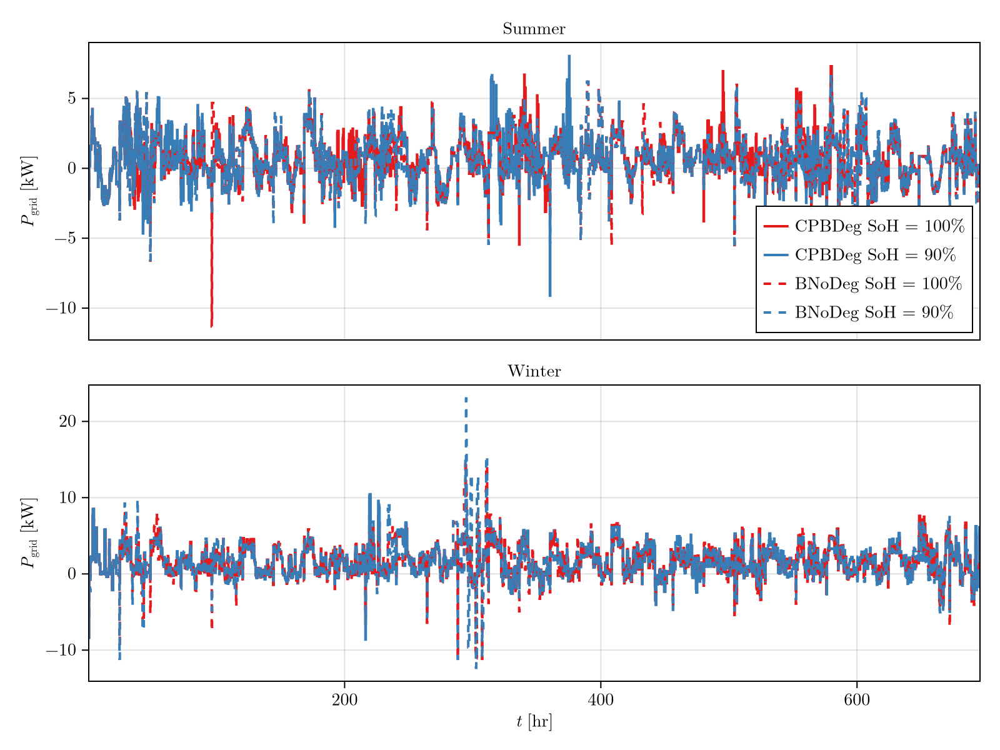

In [9]:
label=L"$P_{\textrm{grid}}$ [kW]"
P_key = "Pg";filename="CS3_Pg_SOH.pdf"
create_Pfig(results, P_key, label; backend="CairoMakie", filename=folder*filename)

### <a id='toc2_1_4_'></a>[Histograms](#toc0_)

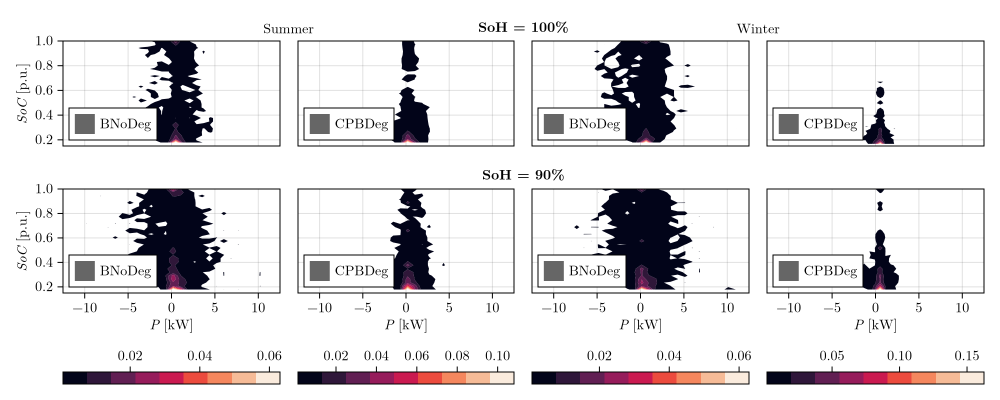

In [25]:
create_SPfig(results, "bess";
            backend="CairoMakie", filename=folder*"CS3_SPbess_SOH.pdf",
            cmaps=:seaborn_rocket_gradient,
            lims=([-12.5, 12.5], [0.15, 1.0]),
            nb=30,
            )

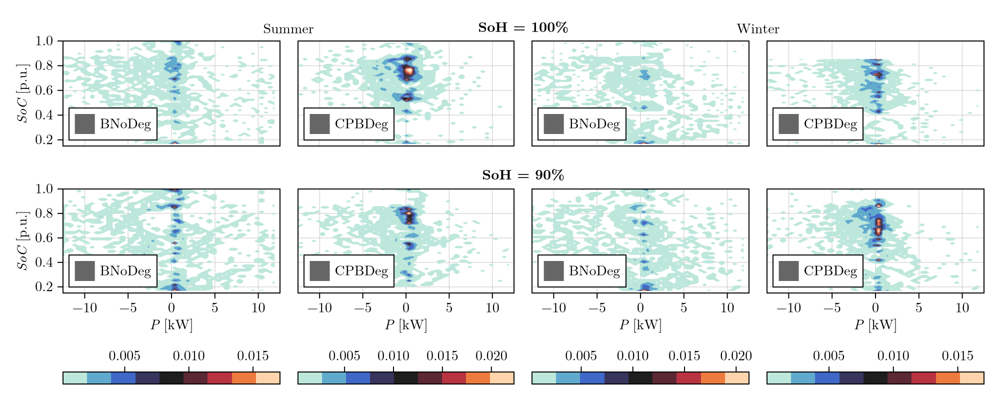

In [34]:
create_SPfig(results, "ev[1]";
            backend="CairoMakie", filename=folder*"CS3_SPev_SOH.pdf",
            cmaps=:seaborn_icefire_gradient,
            lims=([-12.5, 12.5], [0.15, 1.0]),
            nb=50,
            )

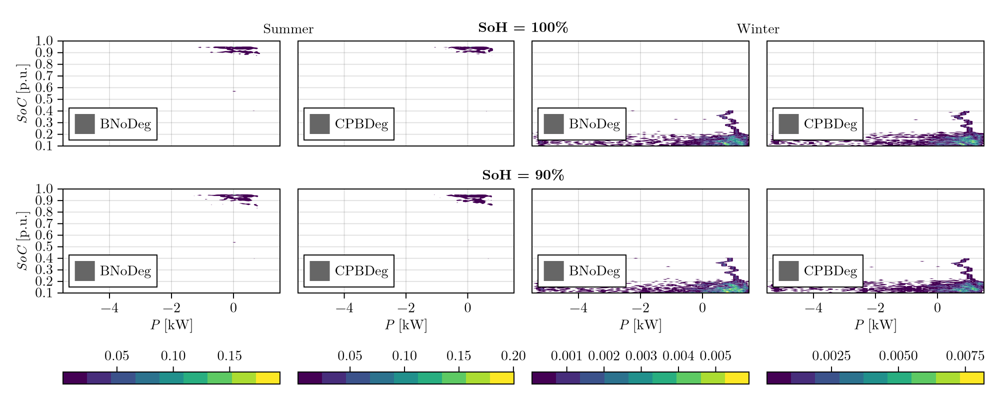

In [27]:
create_SPfig(results, "tess";
            backend="CairoMakie", filename=folder*"CS3_SPtess_SOH.pdf",
            cmaps=:viridis,
            lims=([-5.5, 1.5], [0.1, 1.0])
            )

### <a id='toc2_1_5_'></a>[Degradation analysis](#toc0_)

In [35]:
folder = "../images/AppEnergy/cs3/"; # relative path to the

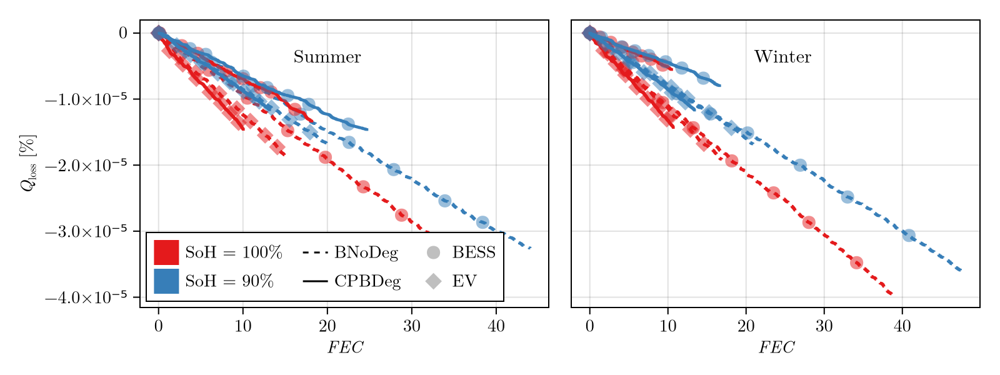

In [39]:
create_FECQlossfig(results; step = 350, backend="CairoMakie", filename=folder*"CS3_FECQloss_SoH.pdf")

Cost analysis

In [42]:
costSummary_DA = Dict(:BNoDeg=>Dict(:summer => Dict(), :winter => Dict()),
                :CPBDeg=>Dict(:summer => Dict(), :winter => Dict()));
dailyCgrid = Dict(:BNoDeg=>Dict(:summer => Dict(), :winter => Dict()),
                :CPBDeg=>Dict(:summer => Dict(), :winter => Dict()));
Wgrid = 1; Wloss = 1;
W=[Wgrid 1000 Wloss 1000];
# for season ∈ [:summer, :winter]
for (d, DAtype) ∈ enumerate([:CPBDeg, :BNoDeg])
    for (j, season) ∈ enumerate([:summer, :winter])
        for (i, SoH) ∈ enumerate([1.0, 0.9])
            concRes = results[DAtype][season][:results][i]
            t0 = concRes[:"t"][1]; 
            Δt = concRes["t"][2] - concRes["t"][1];
            SoHkey = "SoH=$(SoH*100)"
            s=modelSettings(nEV=1, t0=t0,Tw=48-1/4, Δt=Δt, steps=29, costWeights=W,
                    season=String(season), profType="monthly", loadType="GV", year=2023);
            inputs = build_data(;nEV=s.nEV, season=s.season,
                                profType=s.profType, loadType=s.loadType,
                                year=s.year, cellID="SYNSANYO")
            inputs[:"grid"].λ /= 1000
            inputs[:"grid"].λ /= 3600
            costSummary_DA[DAtype][season][SoHkey] = calcFullObj(concRes, inputs, s);
            # dailyCgrid[DAtype][season][SoHkey] = calcDailyCost(concRes, inputs, s);
        end
    end
end

In [43]:
# make a summary dataframe of the final wCgrid
Cg_df = DataFrame(controller = String[], SoH = Float64[], summer=Float64[], winter=Float64[])
for (d, DAtype) ∈ enumerate([:CPBDeg, :BNoDeg])
    for (i, SoH) ∈ enumerate([1.0, 0.9])
        SoHkey = "SoH=$(SoH*100)"
        push!(Cg_df, [String(DAtype), SoH, costSummary_DA[DAtype][:summer][SoHkey].wCgrid[end], costSummary_DA[DAtype][:winter][SoHkey].wCgrid[end]])
    end
end
Cg_df

Row,controller,SoH,summer,winter
,String,Float64,Float64,Float64
1,CPBDeg,1.0,64.6757,116.864
2,CPBDeg,0.9,60.8711,120.856
3,BNoDeg,1.0,55.3903,101.663
4,BNoDeg,0.9,58.6611,111.311


In [44]:
# make a summary dataframe of the final wCgrid
Qloss_df = DataFrame(controller = String[], SoH = Float64[], summer=Float64[], winter=Float64[])
for (d, DAtype) ∈ enumerate([:CPBDeg, :BNoDeg])
    for (i, SoH) ∈ enumerate([1.0, 0.9])
        SoHkey = "SoH=$(SoH*100)"
        push!(Qloss_df, [String(DAtype), SoH, costSummary_DA[DAtype][:summer][SoHkey].wCloss[end]/Wloss*1e3/1.2,
                                            costSummary_DA[DAtype][:winter][SoHkey].wCloss[end]/Wloss*1e3/1.2])
    end
end
Qloss_df # in mAh

Row,controller,SoH,summer,winter
,String,Float64,Float64,Float64
1,CPBDeg,1.0,242.924,210.176
2,CPBDeg,0.9,168.638,149.3
3,BNoDeg,1.0,377.311,400.136
4,BNoDeg,0.9,281.109,288.31


The *CPBDeg* planner improves its performance when using aged batteries in comparison with its linear no degradation counterpart.